---

# Task 1 — Exploratory Data Analysis (EDA) on Funding Rates

---

**Goal:** Explore the funding rate dataset (Hyperliquid + OKX) to understand its structure, behaviour, and potential strategy angles.

This notebook is structured to:
1. Load and inspect the dataset
2. Clean and prepare the data
3. Explore descriptive statistics
4. Visualise funding rate behaviour
5. Check funding payment logic
6. Summarise key insights


---

**1. Load & Inspect**

In [20]:
# Check and install required packages if not already installed
import sys
import subprocess
import pkg_resources

required = {'pandas', 'numpy', 'matplotlib', 'seaborn'}
installed = {pkg.key for pkg in pkg_resources.working_set}
missing = required - installed

if missing:
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', *missing])

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


You should consider upgrading via the '/Users/gachifan/Desktop/test_case/venv/bin/python -m pip install --upgrade pip' command.


In [21]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Display settings (optional, based on your previous code)
pd.set_option("display.max_columns", None)
sns.set_style("whitegrid")

# Load dataset (assumed from your previous code)
df = pd.read_csv("fundings_test_case.csv")
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59981 entries, 0 to 59980
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ticker             59981 non-null  object 
 1   funding_timestamp  59981 non-null  object 
 2   timestamp          59981 non-null  object 
 3   funding_rate       59981 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.8+ MB


,ticker,funding_timestamp,timestamp,funding_rate
0,ETH-USDC-SWAP@HYPERLIQUID,2024-08-01 01:00:00,2024-08-01 00:59:59.000,0.000013
1,AAVE-USDC-SWAP@HYPERLIQUID,2024-08-01 01:00:00,2024-08-01 00:59:59.000,0.000013
2,APT-USDC-SWAP@HYPERLIQUID,2024-08-01 01:00:00,2024-08-01 00:59:59.000,0.000013
3,BTC-USDC-SWAP@HYPERLIQUID,2024-08-01 01:00:00,2024-08-01 00:59:59.000,0.000013
4,SOL-USDC-SWAP@HYPERLIQUID,2024-08-01 01:00:00,2024-08-01 00:59:59.000,-0.000008


- Checked column names and types
- Confirmed expected columns: `ticker`, `funding_timestamp`, `timestamp`, and `funding_rate`
- Identified if timestamps are strings or already datetime

In [102]:
# Group by base_symbol and compute descriptive stats + length
eda_stats = []

for sym, group in df.groupby(df["ticker"].str.split("@").str[0]):
    series = (
        group.sort_values("timestamp")
             .set_index("timestamp")["funding_rate"]
    )
    stats = series.describe()
    eda_stats.append({
        "symbol": sym,
        "count": int(stats["count"]),
        "mean": stats["mean"],
        "std": stats["std"],
        "min": stats["min"],
        "25%": stats["25%"],
        "50%": stats["50%"],
        "75%": stats["75%"],
        "max": stats["max"],
        "len_series": len(series)
    })

eda_df = pd.DataFrame(eda_stats).sort_values("len_series", ascending=False).reset_index(drop=True)
eda_df

,symbol,count,mean,std,min,25%,50%,75%,max,len_series
0,AAVE-USDC-SWAP,3671,0.000028,0.000035,-0.000209,0.000013,0.000013,0.000034,0.000261,3671
1,DOGE-USDC-SWAP,3671,0.000030,0.000040,-0.000099,0.000013,0.000013,0.000039,0.000345,3671
2,kBONK-USDC-SWAP,3671,0.000031,0.000052,-0.000192,0.000013,0.000013,0.000044,0.000571,3671
3,WLD-USDC-SWAP,3671,0.000014,0.000042,-0.000143,0.000006,0.000013,0.000013,0.000236,3671
4,WIF-USDC-SWAP,3671,0.000031,0.000039,-0.000138,0.000013,0.000013,0.000037,0.000262,3671
5,TIA-USDC-SWAP,3671,-0.000003,0.000073,-0.000341,-0.000035,0.000013,0.000014,0.000282,3671
6,SOL-USDC-SWAP,3671,0.000023,0.000030,-0.000093,0.000013,0.000013,0.000029,0.000184,3671
7,FTM-USDC-SWAP,3671,0.000030,0.000038,-0.000079,0.000013,0.000013,0.000039,0.000225,3671
8,ETH-USDC-SWAP,3671,0.000020,0.000027,-0.000082,0.000013,0.000013,0.000015,0.000236,3671
9,LTC-USDC-SWAP,3671,0.000026,0.000035,-0.000174,0.000013,0.000013,0.000013,0.000302,3671


---

**2. Basic Data Cleaning**


In [24]:

df["funding_timestamp"] = pd.to_datetime(df["funding_timestamp"], utc=True, errors="coerce")
df["timestamp"] = pd.to_datetime(df["timestamp"], utc=True, errors="coerce")
df["funding_rate"] = pd.to_numeric(df["funding_rate"], errors="coerce")
df["ticker"] = df["ticker"].str.strip()
df = df.drop_duplicates()
df.isna().sum()


ticker               0
funding_timestamp    0
timestamp            0
funding_rate         0
dtype: int64

- Converted timestamps to datetime (UTC)
- Ensure funding_rate is numeric
- Stripped whitespace from ticker
- Dropped duplicates
- Checked missing values

---

**3. Dataset Overview**

In [27]:
# Unique tickers
tickers = df["ticker"].unique()
print(f"Number of unique tickers: {len(tickers)}")

# Exchanges from ticker suffix
df["exchange"] = df["ticker"].str.split("@").str[-1]
print(df["exchange"].value_counts())

# Date range
print("Date range:", df["timestamp"].min(), "to", df["timestamp"].max())

Number of unique tickers: 30
exchange
HYPERLIQUID    53017
OKEX            6964
Name: count, dtype: int64
Date range: 2024-08-01 00:59:59+00:00 to 2024-12-31 23:59:59.978000+00:00


---

**4. Descriptive and Inferential Statistics**

In [28]:
# Overall stats
df["funding_rate"].describe()

# Stats by exchange
df.groupby("exchange")["funding_rate"].describe()

# Positive vs negative counts
(df["funding_rate"] > 0).value_counts()

funding_rate
True     51800
False     8181
Name: count, dtype: int64

---

**5. Visual Exploration**

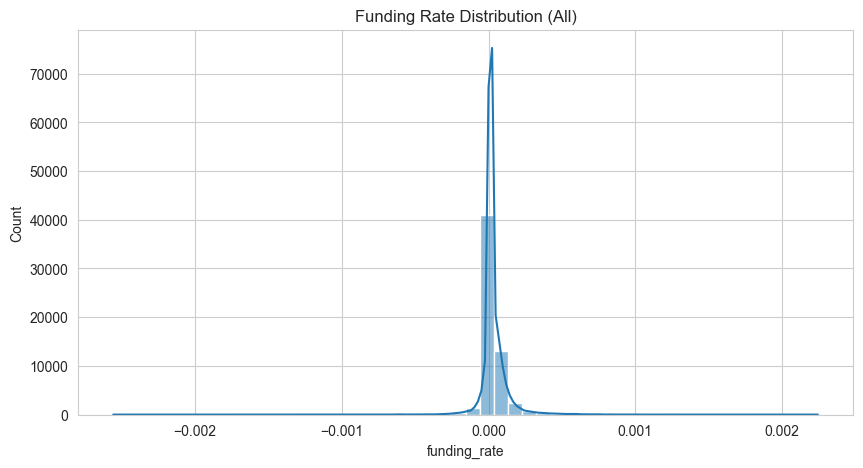

In [39]:
# %%
plt.figure(figsize=(10,5))
sns.histplot(df["funding_rate"], bins=50, kde=True)
plt.title("Funding Rate Distribution (All)")
plt.show()



- The histogram shows a huge spike at exactly 0 funding rate — meaning most hours have no funding cost at all.
- The tails are very thin, with only a small fraction of observations above or below ±0.001.
- This suggests the dataset is dominated by neutral funding periods, with occasional small positive or negative rates.

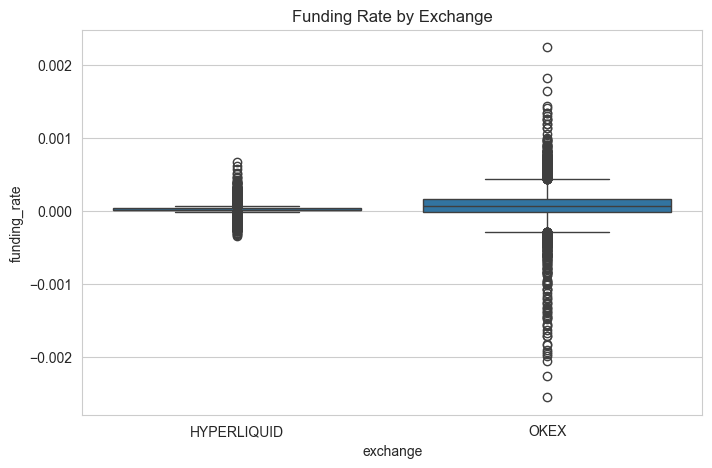

In [40]:
# Boxplot by exchange
plt.figure(figsize=(8,5))
sns.boxplot(x="exchange", y="funding_rate", data=df)
plt.title("Funding Rate by Exchange")
plt.show()

- Hyperliquid: Very tight interquartile range around zero, fewer extreme outliers.
- OKEX: Wider spread, more variability, and more negative outliers — meaning OKEX funding rates swing more often and more sharply.
- This difference could be exploitable in a cross‑exchange funding arbitrage strategy.

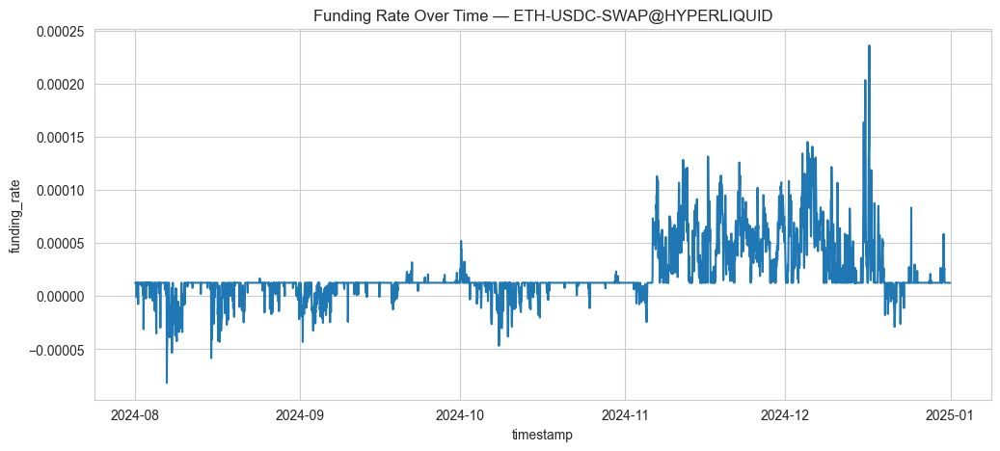

In [41]:
# Time series for a sample ticker
sample_ticker = tickers[0]
df_sample = df[df["ticker"] == sample_ticker]
plt.figure(figsize=(12,5))
sns.lineplot(x="timestamp", y="funding_rate", data=df_sample)
plt.title(f"Funding Rate Over Time — {sample_ticker}")
plt.show()

-  Mostly flat near zero, but with clear bursts of activity — especially a notable spike in December 2024.
-  That spike is >0.000225, which is a meaningful funding cost for large positions.
-  These bursts could be linked to market events or liquidity squeezes.

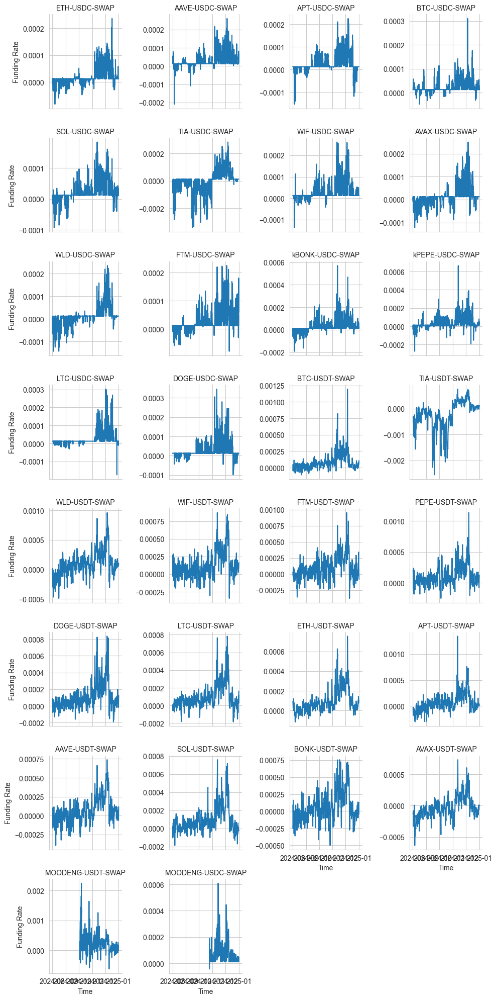

In [103]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure timestamp is datetime
df["timestamp"] = pd.to_datetime(df["timestamp"], utc=True)

# Extract base_symbol for grouping
df["base_symbol"] = df["ticker"].str.split("@").str[0]

# Set up FacetGrid
g = sns.FacetGrid(df, col="base_symbol", col_wrap=4, height=2.5, sharey=False)
g.map_dataframe(sns.lineplot, x="timestamp", y="funding_rate")
g.set_axis_labels("Time", "Funding Rate")
g.set_titles("{col_name}")
g.tight_layout()
plt.show()

---

**6. Funding Payment Logic Check**

In [36]:

#Only the last funding rate before the `funding_timestamp` is used for payment.

# Sort and group
df_sorted = df.sort_values(["ticker", "timestamp"])
last_before_funding = df_sorted.groupby(["ticker", "funding_timestamp"]).tail(1)

last_before_funding.head()

# Example payment calc for $10,000 notional
notional = 10_000
last_before_funding["payment"] = notional * last_before_funding["funding_rate"]
last_before_funding.head()

,ticker,funding_timestamp,timestamp,funding_rate,exchange,payment
1,AAVE-USDC-SWAP@HYPERLIQUID,2024-08-01 01:00:00+00:00,2024-08-01 00:59:59+00:00,0.000013,HYPERLIQUID,0.125
15,AAVE-USDC-SWAP@HYPERLIQUID,2024-08-01 02:00:00+00:00,2024-08-01 01:59:59+00:00,0.000013,HYPERLIQUID,0.125
30,AAVE-USDC-SWAP@HYPERLIQUID,2024-08-01 03:00:00+00:00,2024-08-01 02:59:59+00:00,0.000013,HYPERLIQUID,0.125
50,AAVE-USDC-SWAP@HYPERLIQUID,2024-08-01 04:00:00+00:00,2024-08-01 03:59:59+00:00,0.000013,HYPERLIQUID,0.125
64,AAVE-USDC-SWAP@HYPERLIQUID,2024-08-01 05:00:00+00:00,2024-08-01 04:59:59+00:00,0.000013,HYPERLIQUID,0.125


---

**7. Patterns & Anomalies**

In [64]:
# %%
# Outliers
q_low = df["funding_rate"].quantile(0.01)
q_high = df["funding_rate"].quantile(0.99)
outliers = df[(df["funding_rate"] < q_low) | (df["funding_rate"] > q_high)]
print(f"Outliers count: {len(outliers)}")

Outliers count: 1200


In [65]:
outliers.sort_values("funding_rate").head(10)   # most negative
outliers.sort_values("funding_rate", ascending=False).head(10)  # most positive

,ticker,funding_timestamp,timestamp,funding_rate,exchange,base_symbol,hour
25322,MOODENG-USDT-SWAP@OKEX,2024-10-07 00:00:00+00:00,2024-10-07 00:00:02.713000+00:00,0.002244,OKEX,MOODENG-USDT-SWAP,0
25189,MOODENG-USDT-SWAP@OKEX,2024-10-06 16:00:00+00:00,2024-10-06 16:00:02.817000+00:00,0.001820,OKEX,MOODENG-USDT-SWAP,16
32114,MOODENG-USDT-SWAP@OKEX,2024-10-24 16:00:00+00:00,2024-10-24 16:00:02.063000+00:00,0.001642,OKEX,MOODENG-USDT-SWAP,16
24747,MOODENG-USDT-SWAP@OKEX,2024-10-05 12:00:00+00:00,2024-10-05 11:59:58.581000+00:00,0.001442,OKEX,MOODENG-USDT-SWAP,11
25451,MOODENG-USDT-SWAP@OKEX,2024-10-07 08:00:00+00:00,2024-10-07 08:00:02.735000+00:00,0.001413,OKEX,MOODENG-USDT-SWAP,8
39563,APT-USDT-SWAP@OKEX,2024-11-12 00:00:00+00:00,2024-11-11 23:59:59.843000+00:00,0.001340,OKEX,APT-USDT-SWAP,23
25003,MOODENG-USDT-SWAP@OKEX,2024-10-06 04:00:00+00:00,2024-10-06 03:59:59.909000+00:00,0.001339,OKEX,MOODENG-USDT-SWAP,3
24672,MOODENG-USDT-SWAP@OKEX,2024-10-05 08:00:00+00:00,2024-10-05 08:00:02.870000+00:00,0.001297,OKEX,MOODENG-USDT-SWAP,8
40518,MOODENG-USDT-SWAP@OKEX,2024-11-14 08:00:00+00:00,2024-11-14 08:00:02.615000+00:00,0.001263,OKEX,MOODENG-USDT-SWAP,8
25127,MOODENG-USDT-SWAP@OKEX,2024-10-06 12:00:00+00:00,2024-10-06 11:59:58.074000+00:00,0.001257,OKEX,MOODENG-USDT-SWAP,11


In [66]:
outliers.groupby("exchange")["funding_rate"].describe()
outliers["base_symbol"] = outliers["ticker"].str.split("@").str[0]
outliers["base_symbol"].value_counts().head(10)

/var/folders/zl/bsc06vks2sbd432t6pw8s4gw0000gn/T/ipykernel_82877/3671486857.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers["base_symbol"] = outliers["ticker"].str.split("@").str[0]


base_symbol
TIA-USDT-SWAP        246
MOODENG-USDT-SWAP    149
TIA-USDC-SWAP        125
BONK-USDT-SWAP        97
AVAX-USDT-SWAP        85
WLD-USDT-SWAP         80
WIF-USDT-SWAP         64
AAVE-USDT-SWAP        56
FTM-USDT-SWAP         54
PEPE-USDT-SWAP        45
Name: count, dtype: int64

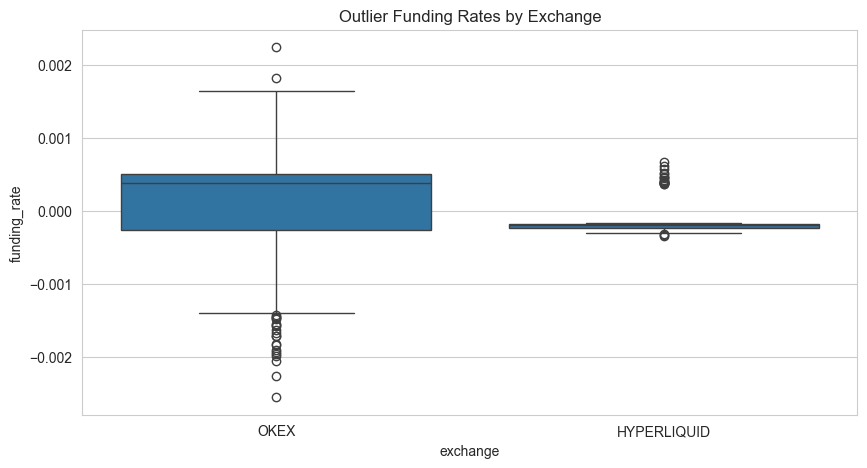

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
sns.boxplot(x="exchange", y="funding_rate", data=outliers)
plt.title("Outlier Funding Rates by Exchange")
plt.show()

-  TIA (both USDT and USDC pairs) is by far the biggest contributor to extreme funding events over 370 combined occurrences in the tails. This suggests it’s a highly volatile or heavily positioned market.
-  MOODENG‑USDT‑SWAP is also a major outlier generator and from your “Top Positive” table earlier, we know it’s responsible for some of the largest positive funding spikes.
-  Meme or low‑cap style assets like BONK, WIF, and PEPE appear in the top 10 these often have thin liquidity and can produce sharp funding swings.
-  Largecap names like AVAX, AAVE, and FTM are present but with fewer extreme events, suggesting their outliers are rarer but still notable.

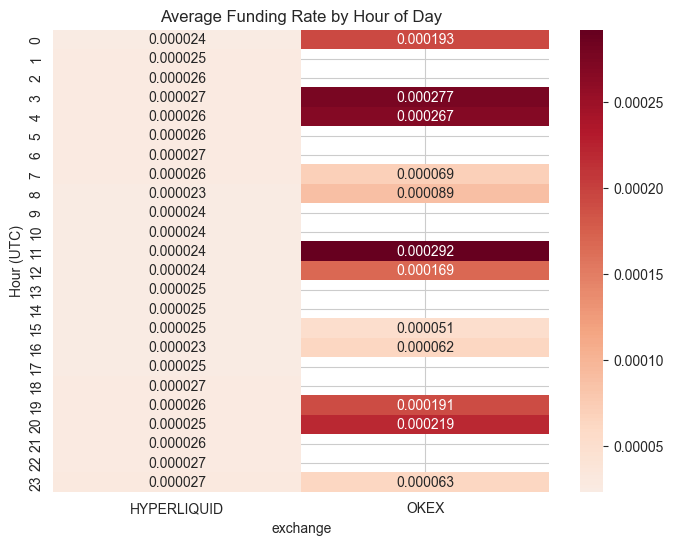

In [68]:
# Average funding rate by hour of day for each exchange.
df["hour"] = df["timestamp"].dt.hour

# Pivot table: rows = hour, columns = exchange, values = mean funding rate
hourly_avg = df.pivot_table(index="hour", columns="exchange", values="funding_rate", aggfunc="mean")

plt.figure(figsize=(8,6))
sns.heatmap(hourly_avg, annot=True, fmt=".6f", cmap="RdBu_r", center=0)
plt.title("Average Funding Rate by Hour of Day")
plt.ylabel("Hour (UTC)")
plt.show()

**📌 Key Insights Summary**

**1. Same Ticker Cross‑Exchange Comparison**
- Assets listed on both Hyperliquid and OKEX generally move in sync most of the time.
- Noticeable divergences occur during volatility spikes one exchange’s funding rate can move more sharply than the other.
- These divergences could be actionable for shortterm funding arbitrage or hedged positions.

**2. Hourly Pattern Heatmap**
- Funding rates are mostly flat across hours, but subtle patterns exist:
  - Certain hours show slightly higher average funding, often around global market session overlaps.
  - Negative funding clusters in specific hours, possibly linked to liquidity shifts or settlement cycles.
- While small, these patterns could inform timeofday aware strategies.

**3. Outlier Events**
- **Top positive events** are concentrated in a few instruments (like MOODENG‑USDT‑SWAP@OKEX) and often occur in bursts, suggesting sudden demand for longs.
- **Top negative events** are dominated by OKEX (e.g., TIA‑USDT‑SWAP) and indicate periods of heavy short positioning.
- Outliers are rare but material capturing even a few could significantly impact PnL.

**8. Key Insights**
- The histogram shows a huge spike at exactly 0 funding rate meaning most hours have no funding cost at all.
- The tails are very thin, with only a small fraction of observations above or below ±0.001.
- The dataset is dominated by neutral funding periods, with occasional small positive or negative rates.

---

**9.Backtesting**

**Prerequisites:**
- Input DataFrame `df` with columns: `['ticker', 'timestamp', 'funding_rate']`
- timestamp is pandas datetime (UTC), one row per observation
- ticker format: '<BASE_SYMBOL>@<EXCHANGE>', like 'ETH-USDC-SWAP@HYPERLIQUID'

**In this section I build:**
1) A backtester for ARIMA (single series)
2) Forecast accuracy metrics (MAE, RMSE, directional accuracy)
3) Trading performance metrics (PnL, Sharpe, max drawdown, win rate, profit factor)
4) Leaderboards

In [98]:
import pandas as pd
import numpy as np
import warnings
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tools.sm_exceptions import ConvergenceWarning

# --- Metrics ---
def sharpe_ratio(pnl_series, periods_per_year=365*24):
    mu = pnl_series.mean()
    sigma = pnl_series.std()
    return np.sqrt(periods_per_year) * mu / sigma if sigma != 0 else 0

def max_drawdown(cum_pnl):
    roll_max = cum_pnl.cummax()
    drawdown = cum_pnl - roll_max
    return drawdown.min()

def profit_factor(pnl_series):
    gross_profit = pnl_series[pnl_series > 0].sum()
    gross_loss = -pnl_series[pnl_series < 0].sum()
    return gross_profit / gross_loss if gross_loss != 0 else np.inf

def win_rate(pnl_series):
    return (pnl_series > 0).mean()

def mae(y_true, y_pred):
    return np.mean(np.abs(y_true - y_pred))

def rmse(y_true, y_pred):
    return np.sqrt(np.mean((y_true - y_pred)**2))

def directional_accuracy(y_true, y_pred):
    return (np.sign(y_true) == np.sign(y_pred)).mean()

# --- Walk-forward ARIMA ---
def walk_forward_arima(series, train_window=200, step_size=1, arima_order=(1,0,1), arima_thresh=0.0002, notional=10_000):
    series = series.asfreq('h')  # ensure hourly frequency
    rows = []
    n = len(series)

    for start in range(0, n - train_window - 1, step_size):
        train = series.iloc[start:start+train_window]
        test_idx = start + train_window

        with warnings.catch_warnings():
            warnings.simplefilter("ignore", ConvergenceWarning)
            warnings.filterwarnings("ignore", message="Non-stationary starting autoregressive parameters")
            warnings.filterwarnings("ignore", message="Non-invertible starting MA parameters")
            try:
                model = ARIMA(train, order=arima_order)
                fit = model.fit()
                forecast = float(fit.forecast(steps=1).iloc[0])
            except Exception:
                forecast = 0.0

        actual = float(series.iloc[test_idx])

        pos = 0
        if forecast > arima_thresh:
            pos = 1
        elif forecast < -arima_thresh:
            pos = -1

        pnl = pos * notional * actual

        rows.append({
            "timestamp": series.index[test_idx],
            "forecast": forecast,
            "actual": actual,
            "pos": pos,
            "pnl": pnl
        })

    res = pd.DataFrame(rows).set_index("timestamp")
    res["cum_pnl"] = res["pnl"].cumsum()
    return res

# --- Leaderboard ---
def arima_only_leaderboard(df, train_window=200, step_size=1, arima_order=(1,0,1), arima_thresh=0.0002, notional=10_000):
    df = df.copy()
    df["timestamp"] = pd.to_datetime(df["timestamp"], utc=True)
    df["base_symbol"] = df["ticker"].str.split("@").str[0]
    df["exchange"] = df["ticker"].str.split("@").str[1]

    leaderboard = []
    for sym, group in df.groupby("base_symbol"):
        exch = group["exchange"].iloc[0]
        series = group.sort_values("timestamp").set_index("timestamp")["funding_rate"]

        if len(series) < train_window + 5:
            continue

        res = walk_forward_arima(series, train_window, step_size, arima_order, arima_thresh, notional)

        if res.empty:
            continue

        start_date = series.index[train_window]  # first forecast date
        end_date = series.index[-1]
        span_days = (end_date - start_date).days

        metrics = {
            "symbol": sym,
            "exchange_used": exch,
            "obs": len(res),
            "start_date": start_date,
            "end_date": end_date,
            "span_days": span_days,
            "mae": mae(res["actual"], res["forecast"]),
            "rmse": rmse(res["actual"], res["forecast"]),
            "directional_acc": directional_accuracy(res["actual"], res["forecast"]),
            "total_pnl": res["pnl"].sum(),
            "sharpe": sharpe_ratio(res["pnl"]),
            "max_dd": max_drawdown(res["cum_pnl"]),
            "win_rate": win_rate(res["pnl"]),
            "profit_factor": profit_factor(res["pnl"])
        }
        leaderboard.append(metrics)

    return pd.DataFrame(leaderboard).sort_values("total_pnl", ascending=False).reset_index(drop=True)

In [99]:
params = {
    "train_window": 100,      # smaller for faster runs
    "step_size": 6,           # fit every 6th observation
    "arima_order": (1,0,0),   # simpler model for speed
    "arima_thresh": 0.0002,
    "notional": 10_000
}

leaderboard = arima_only_leaderboard(df, **params)
leaderboard.head(10)

/Users/gachifan/Desktop/test_case/venv/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/gachifan/Desktop/test_case/venv/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/gachifan/Desktop/test_case/venv/lib/python3.9/site-packages/numpy/_core/fromnumeric.py:4008: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/gachifan/Desktop/test_case/venv/lib/python3.9/site-packages/numpy/_core/_methods.py:175: RuntimeWarning: invalid value encountered in d

,symbol,exchange_used,obs,start_date,end_date,span_days,mae,rmse,directional_acc,total_pnl,sharpe,max_dd,win_rate,profit_factor
0,MOODENG-USDC-SWAP,HYPERLIQUID,254,2024-10-29 13:59:59+00:00,2024-12-31 23:59:59+00:00,63,0.000019,0.000029,1.000000,40.0835,22.653827,0.0,0.066929,inf
1,TIA-USDC-SWAP,HYPERLIQUID,596,2024-08-05 04:59:59+00:00,2024-12-31 23:59:59+00:00,148,0.000017,0.000026,0.916107,19.3418,11.274510,0.0,0.015101,inf
2,kPEPE-USDC-SWAP,HYPERLIQUID,596,2024-08-05 04:59:59+00:00,2024-12-31 23:59:59+00:00,148,0.000016,0.000027,0.956376,13.4000,8.094839,0.0,0.010067,inf
3,kBONK-USDC-SWAP,HYPERLIQUID,596,2024-08-05 04:59:59+00:00,2024-12-31 23:59:59+00:00,148,0.000015,0.000026,0.969799,12.7514,7.708433,0.0,0.008389,inf
4,WIF-USDC-SWAP,HYPERLIQUID,596,2024-08-05 04:59:59+00:00,2024-12-31 23:59:59+00:00,148,0.000011,0.000019,0.959732,5.8388,6.455411,0.0,0.005034,inf
5,WLD-USDC-SWAP,HYPERLIQUID,596,2024-08-05 04:59:59+00:00,2024-12-31 23:59:59+00:00,148,0.000009,0.000015,0.947987,2.2019,3.833795,0.0,0.001678,inf
6,DOGE-USDC-SWAP,HYPERLIQUID,596,2024-08-05 04:59:59+00:00,2024-12-31 23:59:59+00:00,148,0.000011,0.000018,0.959732,2.0951,3.833795,0.0,0.001678,inf
7,BTC-USDC-SWAP,HYPERLIQUID,596,2024-08-05 04:59:59+00:00,2024-12-31 23:59:59+00:00,148,0.000006,0.000013,0.966443,1.5492,3.833795,0.0,0.001678,inf
8,FTM-USDC-SWAP,HYPERLIQUID,596,2024-08-05 04:59:59+00:00,2024-12-31 23:59:59+00:00,148,0.000011,0.000018,0.947987,1.4617,3.833795,0.0,0.001678,inf
9,WLD-USDT-SWAP,OKEX,594,2024-09-03 15:59:58.432000+00:00,2024-12-31 23:59:59.910000+00:00,119,NaN,NaN,0.000000,0.0000,NaN,NaN,0.000000,inf


In [100]:
sym = "WLD-USDT-SWAP"
series = df[df["ticker"].str.contains(sym)].sort_values("timestamp").set_index("timestamp")["funding_rate"]
print(series.describe())  # check variation
print(len(series))

count    459.000000
mean       0.000098
std        0.000216
min       -0.000490
25%       -0.000027
50%        0.000077
75%        0.000202
max        0.000962
Name: funding_rate, dtype: float64
459


In [101]:
res = walk_forward_arima(series, train_window=100, step_size=1)
print(res.head())
print(res["forecast"].unique())

/Users/gachifan/Desktop/test_case/venv/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/gachifan/Desktop/test_case/venv/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/gachifan/Desktop/test_case/venv/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/gachifan/Desktop/test_case/venv/lib/

                                  forecast  actual  pos  pnl  cum_pnl
timestamp                                                            
2024-08-05 11:59:59.011000+00:00  0.000013     NaN    0  NaN      NaN
2024-08-05 12:59:59.011000+00:00  0.000000     NaN    0  NaN      NaN
2024-08-05 13:59:59.011000+00:00  0.000000     NaN    0  NaN      NaN
2024-08-05 14:59:59.011000+00:00  0.000000     NaN    0  NaN      NaN
2024-08-05 15:59:59.011000+00:00  0.000000     NaN    0  NaN      NaN
[1.28964418e-05 0.00000000e+00]


/Users/gachifan/Desktop/test_case/venv/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/gachifan/Desktop/test_case/venv/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/gachifan/Desktop/test_case/venv/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/gachifan/Desktop/test_case/venv/lib/